In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer
from scipy.cluster.vq import kmeans, vq
from pylab import plot,show
from math import sqrt
%matplotlib inline

In [93]:
df_o = pd.read_csv('data_stocks.csv')

In [94]:
originial_df=df_o

In [95]:
df_o.head()

,DATE,SP500,NASDAQ.AAL,NASDAQ.AAPL,NASDAQ.ADBE,NASDAQ.ADI,NASDAQ.ADP,NASDAQ.ADSK,NASDAQ.AKAM,NASDAQ.ALXN,...,NYSE.WYN,NYSE.XEC,NYSE.XEL,NYSE.XL,NYSE.XOM,NYSE.XRX,NYSE.XYL,NYSE.YUM,NYSE.ZBH,NYSE.ZTS
0,1491226200,2363.6101,42.3300,143.6800,129.6300,82.040,102.2300,85.2200,59.760,121.52,...,84.370,119.035,44.40,39.88,82.03,7.36,50.22,63.86,122.000,53.350
1,1491226260,2364.1001,42.3600,143.7000,130.3200,82.080,102.1400,85.6500,59.840,121.48,...,84.370,119.035,44.11,39.88,82.03,7.38,50.22,63.74,121.770,53.350
2,1491226320,2362.6799,42.3100,143.6901,130.2250,82.030,102.2125,85.5100,59.795,121.93,...,84.585,119.260,44.09,39.98,82.02,7.36,50.12,63.75,121.700,53.365
3,1491226380,2364.3101,42.3700,143.6400,130.0729,82.000,102.1400,85.4872,59.620,121.44,...,84.460,119.260,44.25,39.99,82.02,7.35,50.16,63.88,121.700,53.380
4,1491226440,2364.8501,42.5378,143.6600,129.8800,82.035,102.0600,85.7001,59.620,121.60,...,84.470,119.610,44.11,39.96,82.03,7.36,50.20,63.91,121.695,53.240


In [96]:
df_o.describe()

,DATE,SP500,NASDAQ.AAL,NASDAQ.AAPL,NASDAQ.ADBE,NASDAQ.ADI,NASDAQ.ADP,NASDAQ.ADSK,NASDAQ.AKAM,NASDAQ.ALXN,...,NYSE.WYN,NYSE.XEC,NYSE.XEL,NYSE.XL,NYSE.XOM,NYSE.XRX,NYSE.XYL,NYSE.YUM,NYSE.ZBH,NYSE.ZTS
count,4.126600e+04,41266.000000,41266.000000,41266.000000,41266.00000,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000,...,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000
mean,1.497749e+09,2421.537882,47.708346,150.453566,141.31793,79.446873,103.480398,102.998608,50.894352,122.981163,...,97.942211,104.740666,46.664402,43.043984,80.784595,19.300718,54.541988,71.757891,121.423515,60.183874
std,3.822211e+06,39.557135,3.259377,6.236826,6.91674,2.000283,4.424244,9.389788,4.833931,11.252010,...,5.411795,10.606694,1.508444,1.714533,1.840989,11.686532,3.526321,4.038272,5.607070,3.346887
min,1.491226e+09,2329.139900,40.830000,140.160000,128.24000,74.800000,95.870000,83.000000,44.650000,96.250000,...,83.410000,89.510000,44.090000,39.120000,76.060000,6.660000,48.820000,63.180000,110.120000,52.300000
25%,1.494432e+09,2390.860100,44.945400,144.640000,135.19500,78.030000,101.300000,94.820000,47.440000,116.950000,...,95.960000,95.010000,45.155000,41.955000,80.220000,7.045000,51.630000,69.110000,117.580000,59.620000
50%,1.497638e+09,2430.149900,48.360000,149.945000,142.26000,79.410000,102.440000,106.820000,49.509900,123.620000,...,99.250000,99.660000,46.810000,43.200000,81.150000,27.890000,53.850000,73.470000,120.650000,61.585600
75%,1.501090e+09,2448.820100,50.180000,155.065000,147.10000,80.580000,104.660000,110.490000,52.230000,132.218800,...,102.080000,117.034700,47.730000,44.370000,82.062050,30.470000,57.140000,74.750000,126.000000,62.540000
max,1.504210e+09,2490.649900,54.475000,164.510000,155.33000,90.440000,121.770000,119.270000,62.560000,142.875000,...,106.375000,123.870000,49.660000,47.210000,83.630000,32.930000,62.130000,77.120000,133.450000,63.840000


In [97]:
df_o.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41266 entries, 0 to 41265
Columns: 502 entries, DATE to NYSE.ZTS
dtypes: float64(501), int64(1)
memory usage: 158.0 MB


In [98]:
df_o['DATE'] = pd.to_datetime(df_o['DATE'],unit='s')

In [60]:
# As observed from the data# All the stocks are having multiple entries for each day So there is need to convert stock dataset which will be having
# Open, Closse, High and Low price for any perticular day
data2 = pd.DataFrame()
all_data = {}
closed = {}
for col in df_o.columns[1:]:
    try :
        df_col = col.split('.')[1]
    except :
        df_col = col
        
    Open = df_o.groupby([df_o['DATE'].dt.date])[col].first()
    Low = df_o.groupby([df_o['DATE'].dt.date])[col].min()
    High = df_o.groupby([df_o['DATE'].dt.date])[col].max()
    Close = df_o.groupby([df_o['DATE'].dt.date])[col].last()
        
    df = pd.DataFrame([Open,Close,Low,High])
    df2=pd.DataFrame([Close])
    
    df = df.transpose()
    df2=df2.transpose()
    df.columns = ['Open','Low','High','Close']
    all_data[col] = df
    closed[col] = df2

In [61]:
closed_df=all_data['NASDAQ.AAL'].reset_index()

In [62]:
for item in closed.keys():
    closed_df = pd.merge(closed_df,closed[item].reset_index())
closed_df.index = closed_df['DATE']
closed_df = closed_df.drop('DATE', axis=1)
closed_df=closed_df.drop(['Open','Low','High','Close'], axis=1)

In [63]:
closed_df

,SP500,NASDAQ.AAL,NASDAQ.AAPL,NASDAQ.ADBE,NASDAQ.ADI,NASDAQ.ADP,NASDAQ.ADSK,NASDAQ.AKAM,NASDAQ.ALXN,NASDAQ.AMAT,...,NYSE.WYN,NYSE.XEC,NYSE.XEL,NYSE.XL,NYSE.XOM,NYSE.XRX,NYSE.XYL,NYSE.YUM,NYSE.ZBH,NYSE.ZTS
DATE,,,,,,,,,,,,,,,,,,,,,
2017-04-03,2358.9600,42.480,143.7000,129.62,81.22,101.27,85.39,58.10,119.280,38.89,...,84.010,118.110,44.390,39.390,82.0800,7.250,49.430,63.5500,121.350,53.1750
2017-04-04,2359.9600,40.900,144.7700,130.04,81.24,101.45,84.95,59.30,118.300,39.00,...,84.180,119.920,44.500,39.710,82.3400,7.220,50.360,63.8400,120.780,52.6400
2017-04-05,2352.8401,41.310,144.0200,129.89,80.04,101.93,83.54,58.80,116.210,38.38,...,84.340,117.650,44.810,39.370,82.5300,7.150,50.410,63.8700,120.170,52.6700
2017-04-06,2357.6699,41.720,143.6850,130.15,80.32,101.75,84.07,58.73,115.490,38.59,...,85.170,118.140,44.600,39.800,83.0200,7.130,50.930,64.5600,120.220,52.6800
2017-04-07,2355.6899,41.810,143.3400,130.22,80.01,102.19,84.79,58.10,115.620,38.93,...,84.690,118.220,44.400,39.820,82.7800,7.130,50.840,64.2800,119.880,52.5500
2017-04-10,2357.1299,42.320,143.1400,130.16,79.33,102.14,85.66,58.51,117.410,38.86,...,85.390,119.380,44.610,40.110,83.1200,7.080,50.740,64.1300,120.010,52.7308
2017-04-11,2353.8799,43.930,141.6300,129.95,78.08,102.09,85.99,59.01,116.890,38.20,...,85.810,120.740,44.580,40.520,82.8700,7.090,50.680,64.1500,119.590,52.8600
2017-04-12,2344.6299,43.960,141.8000,129.38,76.87,101.95,85.63,58.88,114.570,37.77,...,87.120,121.910,44.910,40.325,82.9600,7.040,49.370,64.0350,119.160,53.2300
2017-04-13,2329.1399,43.350,141.0500,129.05,76.51,101.26,84.91,58.80,118.350,37.52,...,87.350,119.090,44.840,40.020,81.7000,7.030,48.870,63.7600,119.530,53.1000


Text(0.5, 1.0, 'Elbow curve')

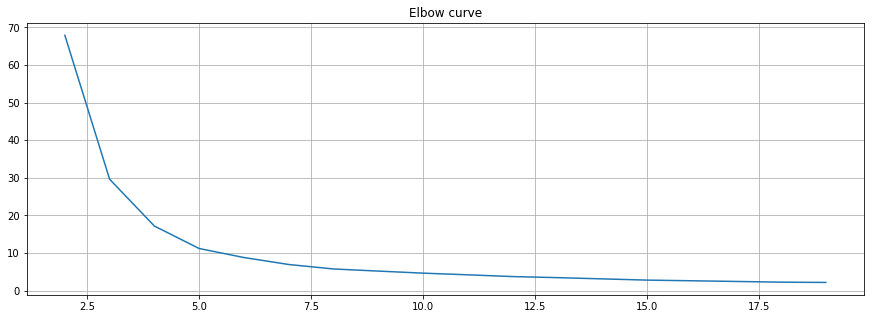

In [65]:
#now our data is ready for clustering .to decide on number of cluster lets use elbow curve
returns = closed_df.pct_change().mean() * 252
returns = pd.DataFrame(returns)
returns.columns = ['Returns']
returns['Volatility'] = closed_df.pct_change().std() * sqrt(252)
 
#format the data as a numpy array to feed into the K-Means algorithm
data = np.asarray([np.asarray(returns['Returns']),np.asarray(returns['Volatility'])]).T
 
X = data
distorsions = []
for k in range(2, 20):
    k_means = KMeans(n_clusters=k)
    k_means.fit(X)
    distorsions.append(k_means.inertia_)
 
fig = plt.figure(figsize=(15, 5))
plt.plot(range(2, 20), distorsions)
plt.grid(True)
plt.title('Elbow curve')

In [12]:
#as per elbow curve lets use 5 as cluster

In [66]:
data_start=data

In [67]:
# computing K-Means with K = 5 (5 clusters)
centroids,_ = kmeans(data,5)
# assign each sample to a cluster
idx,_ = vq(data,centroids)

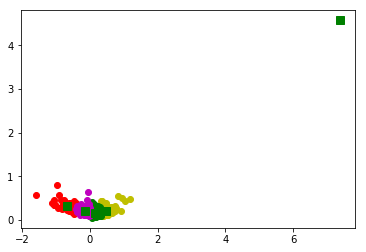

In [68]:
#  plotting using numpy's
plot(data[idx==0,0],data[idx==0,1],'ob',
     data[idx==1,0],data[idx==1,1],'oy',
     data[idx==2,0],data[idx==2,1],'or',
     data[idx==3,0],data[idx==3,1],'og',
     data[idx==4,0],data[idx==4,1],'om')
plot(centroids[:,0],centroids[:,1],'sg',markersize=8)
show()

In [69]:
#getting the outlier
print(returns.idxmax())

Returns       NYSE.XRX
Volatility    NYSE.XRX
dtype: object


In [70]:
#so drop the XRX
closed_df.drop(['NYSE.XRX'],axis=1,inplace=True)

In [71]:
returns = closed_df.pct_change().mean() * 252
returns = pd.DataFrame(returns)
returns.columns = ['Returns']
returns['Volatility'] = closed_df.pct_change().std() * sqrt(252)
 
#format the data as a numpy array to feed into the K-Means algorithm
data = np.asarray([np.asarray(returns['Returns']),np.asarray(returns['Volatility'])]).T

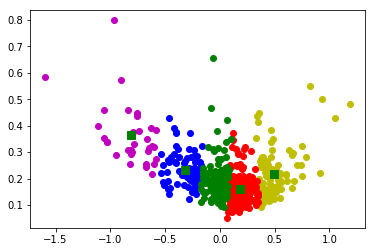

In [72]:
#Plotting clusters with their centroids
centroids,_ = kmeans(data,5)
# assign each sample to a cluster
idx,_ = vq(data,centroids)

# some plotting using numpy's logical indexing
plot(data[idx==0,0],data[idx==0,1],'ob',
     data[idx==1,0],data[idx==1,1],'oy',
     data[idx==2,0],data[idx==2,1],'or',
     data[idx==3,0],data[idx==3,1],'og',
     data[idx==4,0],data[idx==4,1],'om')
plot(centroids[:,0],centroids[:,1],'sg',markersize=8)
show()

In [73]:
details = [(name,cluster) for name, cluster in zip(returns.index,idx)]

#clustered stocks with similar performances
for detail in details:
    print(detail)

('SP500', 2)
('NASDAQ.AAL', 2)
('NASDAQ.AAPL', 2)
('NASDAQ.ADBE', 1)
('NASDAQ.ADI', 2)
('NASDAQ.ADP', 2)
('NASDAQ.ADSK', 1)
('NASDAQ.AKAM', 0)
('NASDAQ.ALXN', 1)
('NASDAQ.AMAT', 1)
('NASDAQ.AMD', 3)
('NASDAQ.AMGN', 2)
('NASDAQ.AMZN', 2)
('NASDAQ.ATVI', 1)
('NASDAQ.AVGO', 1)
('NASDAQ.BBBY', 4)
('NASDAQ.BIIB', 1)
('NASDAQ.CA', 2)
('NASDAQ.CBOE', 1)
('NASDAQ.CELG', 2)
('NASDAQ.CERN', 1)
('NASDAQ.CHRW', 0)
('NASDAQ.CHTR', 1)
('NASDAQ.CINF', 2)
('NASDAQ.CMCSA', 2)
('NASDAQ.CME', 2)
('NASDAQ.COST', 3)
('NASDAQ.CSCO', 3)
('NASDAQ.CSX', 2)
('NASDAQ.CTAS', 2)
('NASDAQ.CTSH', 1)
('NASDAQ.CTXS', 3)
('NASDAQ.DISCA', 4)
('NASDAQ.DISCK', 4)
('NASDAQ.DISH', 0)
('NASDAQ.DLTR', 3)
('NASDAQ.EA', 1)
('NASDAQ.EBAY', 2)
('NASDAQ.EQIX', 1)
('NASDAQ.ESRX', 3)
('NASDAQ.ETFC', 1)
('NASDAQ.EXPD', 3)
('NASDAQ.EXPE', 1)
('NASDAQ.FAST', 0)
('NASDAQ.FB', 1)
('NASDAQ.FFIV', 0)
('NASDAQ.FISV', 2)
('NASDAQ.FITB', 2)
('NASDAQ.FLIR', 2)
('NASDAQ.FOX', 0)
('NASDAQ.FOXA', 0)
('NASDAQ.GILD', 1)
('NASDAQ.GOOG', 2)
('NASDAQ.

In [80]:
df_o.drop(['DATE'],axis=1,inplace=True)

In [83]:
# Create a normalizer: normalizer
normalizer = Normalizer()

# Create a KMeans model with 10 clusters: kmeans
kmeans = KMeans(n_clusters=10)

# Make a pipeline chaining normalizer and kmeans: pipeline
pipeline = make_pipeline(normalizer, kmeans)

# Fit pipeline to the daily price movements
pipeline.fit(data)
labels = pipeline.predict(data_start)
exchanges = np.asarray(df_o.columns)

# Create a DataFrame aligning labels and companies: df
df = pd.DataFrame({'labels': labels, 'exchanges': exchanges})

In [84]:
# Stocks moving together and different from each other
df.sort_values('labels')

,labels,exchanges
363,0,NYSE.MRK
400,0,NYSE.PNR
402,0,NYSE.PPG
468,0,NYSE.UNP
216,0,NYSE.CVS
217,0,NYSE.CVX
409,0,NYSE.PWR
455,0,NYSE.TRV
63,0,NASDAQ.INFO
62,0,NASDAQ.INCY


In [121]:
closed_df.index

Index([2017-04-03, 2017-04-04, 2017-04-05, 2017-04-06, 2017-04-07, 2017-04-10,
       2017-04-11, 2017-04-12, 2017-04-13, 2017-04-17,
       ...
       2017-08-18, 2017-08-21, 2017-08-22, 2017-08-23, 2017-08-24, 2017-08-25,
       2017-08-28, 2017-08-29, 2017-08-30, 2017-08-31],
      dtype='object', name='DATE', length=106)

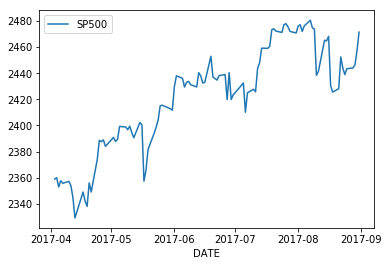

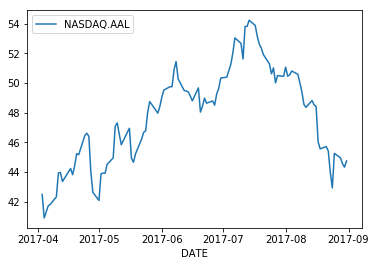

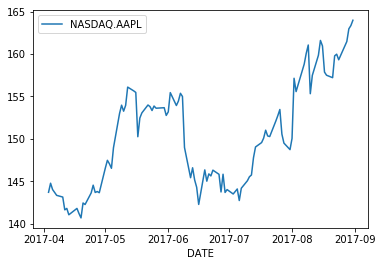

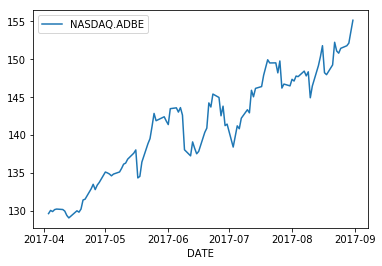

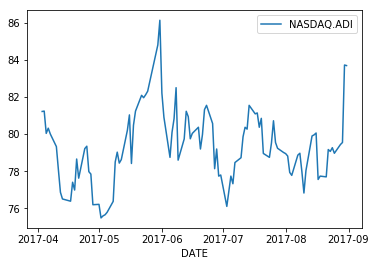

...

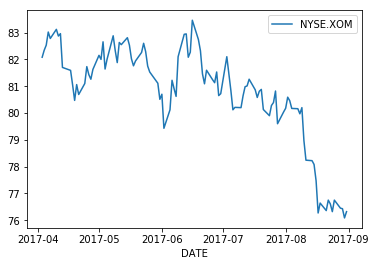

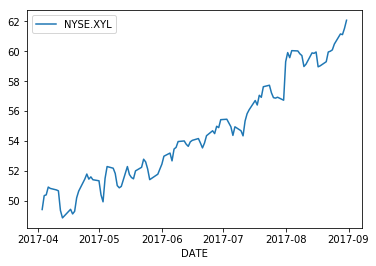

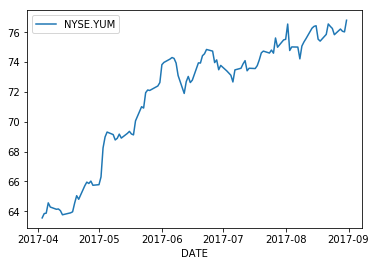

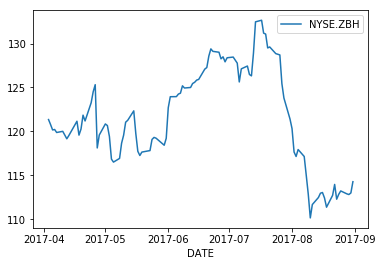

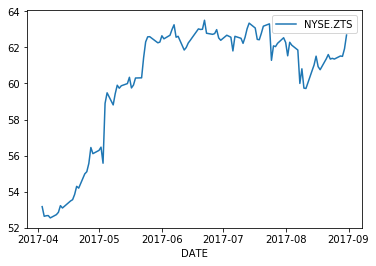

In [130]:
#UNIQUE PATTERN in dateset
for col in closed_df.columns:
    if col!='DATE':
        closed_df.reset_index().plot(x='DATE', y=col)
        plt.show()

In [132]:
#try with hierarical Clustering
from scipy.cluster.hierarchy import dendrogram, linkage
closed_arr=np.array(closed_df)

In [133]:
z = linkage(closed_arr,'single')

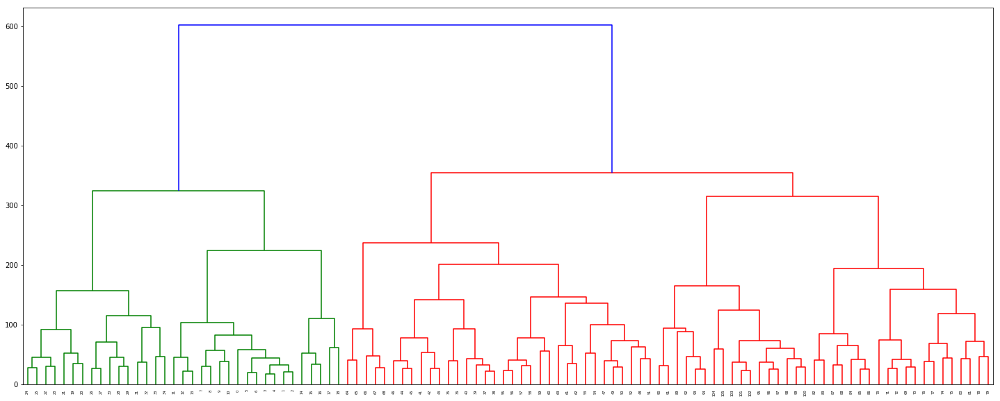

In [138]:
plt.figure(figsize=(25, 10))
pic1 = dendrogram(z)

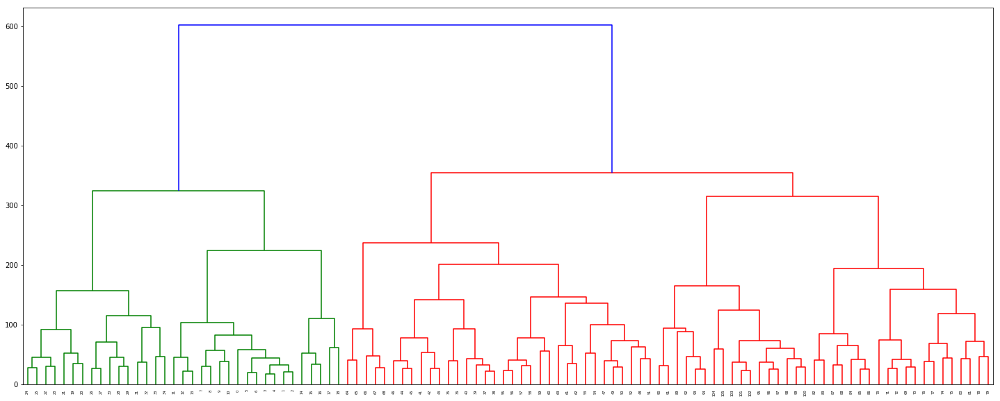

In [137]:
z = linkage(closed_arr,'complete')
plt.figure(figsize=(25, 10))
pic1 = dendrogram(z)

In [140]:
from sklearn.cluster import AgglomerativeClustering
hclust = AgglomerativeClustering(n_clusters=5,affinity='euclidean',linkage='ward')

hclust.fit(closed_arr)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=5,
            pooling_func='deprecated')

In [141]:
silhouette_score(closed_arr, hclust.labels_)

0.47207117814408023